# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="https://github.com/hse-aml/intro-to-dl-pytorch/blob/main/week06/images/encoder_decoder.png?raw=1" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

Alright, here's our plan:
* Take a pre-trained inception v3 to vectorize images
* Stack an LSTM on top of it
* Train the thing on MSCOCO

## Importing stuff and preparing data

In [1]:
%%bash

shred -u setup_colab.py

wget https://raw.githubusercontent.com/hse-aml/intro-to-dl-pytorch/main/utils/setup_colab.py -O setup_colab.py

shred: setup_colab.py: failed to open for writing: No such file or directory
--2022-06-29 18:41:57--  https://raw.githubusercontent.com/hse-aml/intro-to-dl-pytorch/main/utils/setup_colab.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1649 (1.6K) [text/plain]
Saving to: ‘setup_colab.py’

     0K .                                                     100% 22.7M=0s

2022-06-29 18:41:57 (22.7 MB/s) - ‘setup_colab.py’ saved [1649/1649]



In [2]:
import setup_colab

setup_colab.setup_week06()

In [3]:
import grading
import grading_utils

grader = grading.Grader(
    assignment_key="NEDBg6CgEee8nQ6uE8a7OA",
    all_parts=["19Wpv", "E2OIL", "rbpnH", "YJR7z"]
)

In [4]:
# token expires every 30 min
COURSERA_TOKEN = "R8UFiqx0KDW8hGsq"
COURSERA_EMAIL = "ng1987@mail.ru"

In [4]:
%%time

# Load dataset (vectorized images and captions)
import numpy as np
import json

img_codes = np.load("data/image_codes.npy")
captions = json.load(open('data/captions_tokenized.json'))

CPU times: user 172 ms, sys: 388 ms, total: 560 ms
Wall time: 563 ms


In [5]:
print("Each image code is a 2048-unit vector [ shape: %s ]" % str(img_codes.shape))
print(img_codes[0,:10], end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 2048-unit vector [ shape: (118287, 2048) ]
[0.3659946  0.2016555  0.9245725  0.57063824 0.547268   0.8275868
 0.3687277  0.12085301 0.0561931  0.49758485]

For each image there are 5 reference captions, e.g.:

people shopping in an open market for vegetables .
an open market full of people and piles of vegetables .
people are shopping at an open air produce market .
large piles of carrots and potatoes at a crowded outdoor market .
people shop for vegetables like carrots and potatoes at an open air market .


As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [6]:
# split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"] + sentence.split(' ') + ["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to count the occurences of each word so that we can decide which words to keep in our vocabulary.

In [7]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

# Compute word frequencies for each word in captions. See code above for data structure

# YOUR CODE HERE
for caption in captions:
    for cap in caption:
        word_counts.update(cap)

In [8]:
len(word_counts)

29416

In [9]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [10]:
n_tokens

10403

In [11]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [12]:
# Try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   24,  262,  140,    6,  159,   14,   24,  858,  155,   12,
           2,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   53,   18,   24,  858,  155,    2,    3,    3,
           3,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   41,   18,  903,   35,  620,  155,    2,    3,
           3,    3,    3,    3,    3,    3,    3,    3],
       [   1,   45,  115,  262,   41,   53,   18,  620, 1525,   77,   12,
           2,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   53,   18,   24,  858,  123,   58,   45,  276,
        3641,   24, 3642,   35,   45, 1128,   12,    2]], dtype=int32)

## Building our neural network
As we mentioned earlier, we shall build an rnn "language-model" conditioned on vectors from the convolutional part.

<img src="https://github.com/yunjey/pytorch-tutorial/raw/master/tutorials/03-advanced/image_captioning/png/model.png" style="width:70%">

In [13]:
import torch
from torch import nn
import torch.nn.functional as F

In [14]:
class CaptionNet(nn.Module):
    
    
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_feature_size=2048):
        """ A recurrent 'head' network for image captioning. See scheme above. """
        super().__init__()
        
        # a layer that converts conv features to initial_h (h_0) and initial_c (c_0)
        self.cnn_to_h0 = nn.Linear(cnn_feature_size, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_feature_size, lstm_units)

        # create embedding for input words. Use the parameters (e.g. emb_size).
        # YOUR CODE HERE
        self.Embedding = nn.Embedding(n_tokens, 
                                      emb_size)

        # lstm: create a recurrent core of your network. Use either LSTMCell or just LSTM. 
        # In the latter case (nn.LSTM), make sure batch_first=True
        # YOUR CODE HERE
        self.LSTM = nn.LSTM(emb_size, 
                            lstm_units, 
                            batch_first=True)

        # create logits: linear layer that takes lstm hidden state as input and computes one number per token
        # YOUR CODE HERE
        self.logits = nn.Linear(lstm_units, 
                                n_tokens)
        
    def forward(self, image_vectors, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_vectors: torch tensor containing inception vectors. shape: [batch, cnn_feature_size]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """

        self.LSTM.flatten_parameters()

        initial_cell = self.cnn_to_c0(image_vectors)
        initial_hid = self.cnn_to_h0(image_vectors)
        
        # compute embeddings for captions_ix
        # YOUR CODE HERE
        captions_emb = self.Embedding(captions_ix)
 
        # apply recurrent layer to captions_emb. 
        # 1. initialize lstm state with initial_* from above
        # 2. feed it with captions. Mind the dimension order in docstring
        # 3. compute logits for next token probabilities
        # Note: if you used nn.LSTM, you can just give it (initial_cell[None], initial_hid[None]) as second arg

        # lstm_out should be lstm hidden state sequence of shape [batch, caption_length, lstm_units]
        # YOUR CODE HERE
        
        lstm_out, _ = self.LSTM(captions_emb, 
                                (initial_cell[None], initial_hid[None]))

        # compute logits from lstm_out
        # YOUR CODE HERE
        return self.logits(lstm_out) 

In [15]:
network = CaptionNet(n_tokens)

In [16]:
dummy_img_vec = torch.randn(len(captions[0]), 2048)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits = network.forward(dummy_img_vec, dummy_capt_ix)

print('shape:', dummy_logits.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)

shape: torch.Size([5, 16, 10403])


In [17]:
def compute_loss(network, image_vectors, captions_ix):
    """
    :param image_vectors: torch tensor containing inception vectors. shape: [batch, cnn_feature_size]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones. Scalar float tensor
    """
    
    # captions for input - all except last because we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions for captions_ix_next
    logits_for_next = network.forward(image_vectors, captions_ix_inp)
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask!
    # Make sure that predicting next tokens after EOS do not contribute to loss
    # You can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    
    # YOUR CODE HERE    
    return F.cross_entropy(logits_for_next.permute((0,2,1)), 
                           captions_ix_next, 
                           ignore_index=pad_ix).mean()


In [18]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.data.numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
    'loss should depend differentiably on all neural network weights'

## Batch generator

In [19]:
from sklearn.model_selection import train_test_split

captions = np.array(captions)
train_img_codes, val_img_codes, train_captions, val_captions = train_test_split(
    img_codes, captions, test_size=0.1, random_state=42
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  This is separate from the ipykernel package so we can avoid doing imports until


In [20]:
from random import choice

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    # sample random numbers for image/caption indicies
    random_image_ix = np.random.randint(0, len(img_codes), size=batch_size)
    
    # get images
    batch_images = img_codes[random_image_ix]
    
    # 5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    # pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    # convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), \
        torch.tensor(batch_captions_ix, dtype=torch.int64)

In [21]:
generate_batch(img_codes, captions, 3)

(tensor([[0.3943, 0.6171, 0.2646,  ..., 0.2646, 1.2119, 0.1056],
         [0.6682, 0.9645, 0.4432,  ..., 0.0791, 0.1691, 0.2118],
         [0.5891, 0.2515, 0.1427,  ..., 0.1534, 0.1704, 0.2767]]),
 tensor([[   1,   24,  658,   14,  662,   35,   45,   71,   58,   24,  728,   14,
          2347,   12,    2,    3,    3,    3],
         [   1,   24,  291,   58, 5673,  999,  182,   15,   11,   15,   24,  326,
            15, 1812,  140,  161,  156,    2],
         [   1,   24,  119,  185,   14,   24, 2395,   93,  193,  117,   24, 1036,
             2,    3,    3,    3,    3,    3]]))

## Train and validate loop

In [22]:
from tqdm import tqdm_notebook
from tqdm import tqdm
from IPython.display import clear_output

In [23]:
DEVICE = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

In [24]:
network = CaptionNet(n_tokens).to(DEVICE)

In [25]:
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 100
n_batches_per_epoch = 50
n_validation_batches = 5  # how many batches are used for validation after each epoch

In [26]:
for epoch in tqdm(range(n_epochs)):
    
    train_loss = 0
    network.train()
    for _ in (range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    # clear_output()
    if epoch % 10 == 0:
        print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")

  1%|          | 1/100 [00:01<03:10,  1.92s/it]


Epoch: 0, train loss: 5.976544446945191, val loss: 4.831928443908692


 11%|█         | 11/100 [00:18<02:26,  1.64s/it]


Epoch: 10, train loss: 3.3989538383483886, val loss: 3.324393653869629


 21%|██        | 21/100 [00:35<02:15,  1.72s/it]


Epoch: 20, train loss: 3.0207540225982665, val loss: 3.069491720199585


 31%|███       | 31/100 [00:52<01:57,  1.70s/it]


Epoch: 30, train loss: 2.861092753410339, val loss: 2.910272407531738


 41%|████      | 41/100 [01:09<01:45,  1.79s/it]


Epoch: 40, train loss: 2.7600839805603026, val loss: 2.8174249172210692


 51%|█████     | 51/100 [01:28<01:29,  1.83s/it]


Epoch: 50, train loss: 2.690010805130005, val loss: 2.7231733322143556


 61%|██████    | 61/100 [01:46<01:11,  1.83s/it]


Epoch: 60, train loss: 2.6231117391586305, val loss: 2.6976980209350585


 71%|███████   | 71/100 [02:05<00:54,  1.90s/it]


Epoch: 70, train loss: 2.575979652404785, val loss: 2.657139778137207


 81%|████████  | 81/100 [02:24<00:37,  1.95s/it]


Epoch: 80, train loss: 2.5541030597686767, val loss: 2.5749073028564453


 91%|█████████ | 91/100 [02:41<00:15,  1.75s/it]


Epoch: 90, train loss: 2.52108332157135, val loss: 2.57130126953125


100%|██████████| 100/100 [02:57<00:00,  1.78s/it]

Finished!



## Generating caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [27]:
from beheaded_inception3 import beheaded_inception_v3

inception = beheaded_inception_v3().eval()

def generate_caption(image, caption_prefix = ('#START#',), t=1, sample=True, max_len=100):
    network.cpu().eval()

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >= 0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_8x8, vectors_neck, logits = inception(image[None])
    caption_prefix = list(caption_prefix)
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        next_word_logits = network.forward(vectors_neck, prefix_ix)[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().numpy()
        
        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word == '#END#':
            break

    return ' '.join(caption_prefix[1:-1])

/usr/local/lib/python3.7/dist-packages/torchvision/models/inception.py:48: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  FutureWarning,
Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

In [28]:
import matplotlib.pyplot as plt
from skimage.transform import resize

# sample image
! wget https://avatars.mds.yandex.net/get-zen_doc/1578906/pub_5deb7d24a06eaf00af983448_5deb7d6643863f00ae06dc24/scale_1200 -O data/img.jpg

--2022-06-29 18:46:08--  https://avatars.mds.yandex.net/get-zen_doc/1578906/pub_5deb7d24a06eaf00af983448_5deb7d6643863f00ae06dc24/scale_1200
Resolving avatars.mds.yandex.net (avatars.mds.yandex.net)... 87.250.247.182, 87.250.247.183, 87.250.247.184, ...
Connecting to avatars.mds.yandex.net (avatars.mds.yandex.net)|87.250.247.182|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 127270 (124K) [image/jpeg]
Saving to: ‘data/img.jpg’

data/img.jpg        100%[===================>] 124.29K   382KB/s    in 0.3s    

2022-06-29 18:46:09 (382 KB/s) - ‘data/img.jpg’ saved [127270/127270]



a cat is sitting in a room .
a cat is sitting in a chair .
a cat is sitting in a chair in a room .
a cat is sitting on a table .
a cat is sitting on a table .


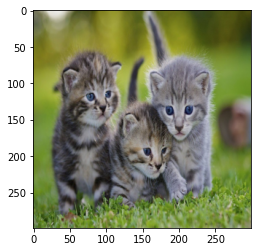

In [29]:
img = plt.imread('data/img.jpg')
img = resize(img, (299, 299))

plt.imshow(img)

for i in range(5):
    print(generate_caption(img, t=5.))

In [ ]:
grader.set_answer("19Wpv", grading_utils.test_vocab(vocab))

In [ ]:
grader.set_answer("rbpnH", grading_utils.test_network(network))

In [ ]:
grader.set_answer("E2OIL", grading_utils.test_batch(generate_batch(img_codes, captions, 3)))

NameError: ignored

In [ ]:
grader.set_answer("YJR7z", val_loss)

# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

# Staff graded assignment tasks

Now you are going to train the network and estimate it's quality on checkpoints.

1. Train the network for 6 epoches (set n_batches_per_epoch to such value, that with batch_size you iterate over the whole dataset at one epoch, you should increase n_validation_batches to validate more accurately), find good and bad annotation examples. What loss values have you achieved?
1. Continue training until 12 epoch. What happened to the loss value? Search for examples, that have improved their captions in comparison to 6 epoch training.
1. Train the network until convergence. How many epoches do you need?
1. Mobile devices are not very powerfull. Try reducing network size (emb_size=64, lstm_units=128), how it affected network quality after 12 epoches in comparison to original network? And visually?
1. Collect at least 10 images that you like to test our network on.
    - Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
    - Make sure it works okay on simple images before going to something more complex
    - Photos, not animation/3d/drawings, unless you want to train CNN network on anime
    - Mind the aspect ratio
    - Photos should not be from MSCOCO! Collect some data yourself, take anything you find worth testing on

### Training tips

* If training loss has become close to 0 or model produces garbage, double-check that you're predicting next words, not current or t+2'th words
* If the model generates fluent captions that have nothing to do with the images
    * this may be due to recurrent net not receiving image vectors.
    * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
    * finally, you may just need to train the model a bit more
* Crossentropy is a poor measure of overfitting
    * Model can overfit validation crossentropy but keep improving validation quality.
    * Use human (manual) evaluation or try automated metrics: cider or bleu
    
* We recommend you to periodically evaluate the network using the next "apply trained model" block
    * its safe to interrupt training, run a few examples and start training again
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=2.8 ~ 3.0

## Images to test on

We have downloaded 30 images from validation set of MSCOCO, they are located in `data` folder and named `img_i.jpg` for i from 0 to 29. You should use them to measure your network quality during checkpoints.

In [30]:
### READ IMAGES FROM DISK
images_list = []

for image in range(30):
    img = plt.imread(f'data/img_{image}')
    img = resize(img, (299, 299))
    images_list.append(img)

## First task

Train the network for 6 epoches (set n_batches_per_epoch to such value, that with batch_size you iterate over the whole dataset at one epoch, you should increase n_validation_batches to validate more accurately), find good and bad annotation examples. What loss values have you achieved?

In [ ]:
DEVICE = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 6
n_batches_per_epoch = 50
n_validation_batches = 5

for epoch in tqdm(range(n_epochs)):
    
    train_loss = 0
    network.train()
    for _ in (range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    # clear_output()
    # if epoch % 10 == 0:
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")

 17%|█▋        | 1/6 [00:02<00:10,  2.14s/it]


Epoch: 0, train loss: 5.9401218032836915, val loss: 4.888126087188721


 33%|███▎      | 2/6 [00:04<00:08,  2.05s/it]


Epoch: 1, train loss: 4.66312572479248, val loss: 4.523961353302002


 50%|█████     | 3/6 [00:06<00:06,  2.09s/it]


Epoch: 2, train loss: 4.348863182067871, val loss: 4.30985803604126


 67%|██████▋   | 4/6 [00:08<00:04,  2.13s/it]


Epoch: 3, train loss: 4.14762571811676, val loss: 4.034525203704834


 83%|████████▎ | 5/6 [00:10<00:02,  2.11s/it]


Epoch: 4, train loss: 3.9891409635543824, val loss: 3.9422609329223635


100%|██████████| 6/6 [00:12<00:00,  2.07s/it]


Epoch: 5, train loss: 3.8849056911468507, val loss: 3.8273830890655516
Finished!


Image 0:


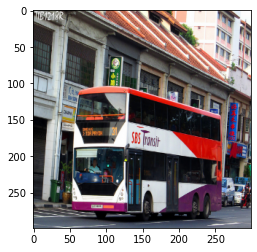

a train is sitting on a table with a large building .
a man is on a table with a window .
a man is standing on a table with a city .
------------------------------------------------------
Image 1:


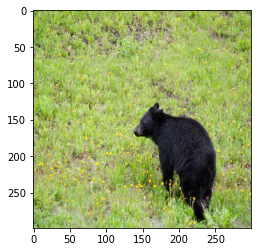

a man is standing on a table with a white plate .
a man is sitting on a table with a large .
a man is holding a black and white
------------------------------------------------------
Image 2:


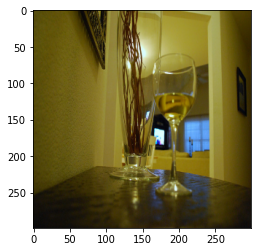

a man in a large white room with a white and white
a man is sitting on a table with a table .
a man is sitting on a table with a small
------------------------------------------------------
Image 3:


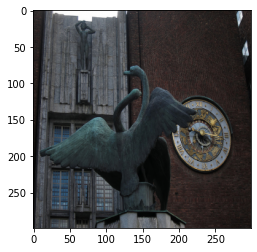

a man is sitting on a table with a white and white
a man is sitting on a bed with a large plate .
a man is sitting on a table with a plate of a plate .
------------------------------------------------------
Image 4:


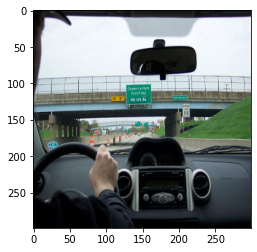

a man is on a table with a city .
a man is sitting on a table with a table .
a man is on a table with a street .
------------------------------------------------------
Image 5:


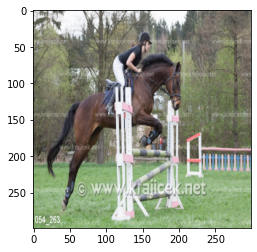

a man is standing on a skateboard in a field .
a man is standing on a bed with a plate .
a man is standing in a field with a plate .
------------------------------------------------------
Image 6:


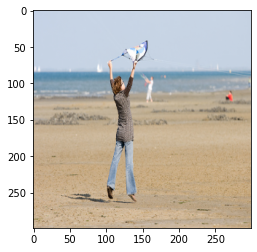

a man is sitting on a skateboard in a field .
a man is on a table with a large building .
a man is a man in a field with a blue
------------------------------------------------------
Image 7:


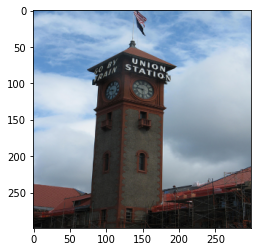

a man is riding a skateboard on a table .
a man in a kitchen with a blue and white
a man with a black and white and white
------------------------------------------------------
Image 8:


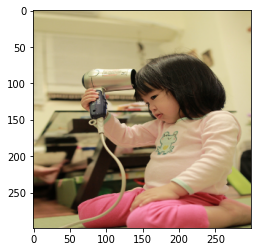

a man is holding a tennis ball in the water .
a man standing on a table with a large .
a man is standing in a city street .
------------------------------------------------------
Image 9:


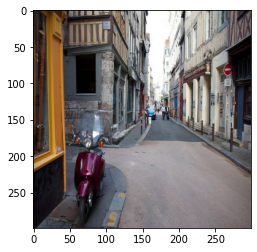

a man is sitting on a table with a large .
a man is on a table with a small and white
a man is on a table with a red and white .
------------------------------------------------------
Image 10:


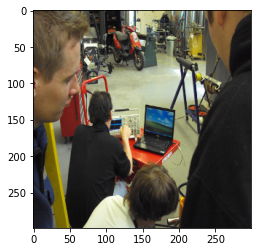

a man is standing in a table with a plate .
a man is standing in a table with a street .
a man is holding a tennis on a field .
------------------------------------------------------
Image 11:


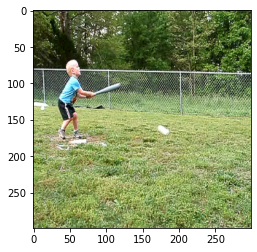

a man is holding a tennis ball .
a man is on a skateboard in a field .
a man is on a tennis court with a couch .
------------------------------------------------------
Image 12:


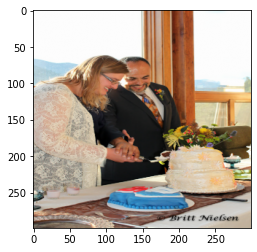

a man is sitting on a table with a #UNK#
a man is a man in a table with a white .
a man is sitting on a table with a table .
------------------------------------------------------
Image 13:


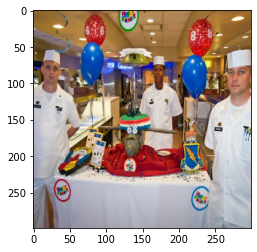

a man is on a table with a #UNK#
a man standing in a table with a toilet
a man is standing on a table with a table .
------------------------------------------------------
Image 14:


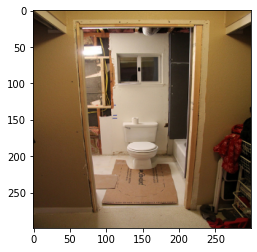

a bathroom with a white and white and white
a man is sitting on a table with a white
a man is sitting on a surfboard in the background .
------------------------------------------------------
Image 15:


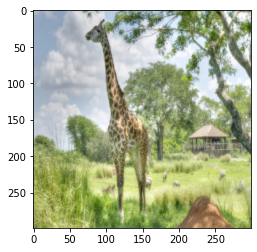

a man is standing on a field with a field .
a man is standing in a table with a large .
a man is standing on a bed with a white .
------------------------------------------------------
Image 16:


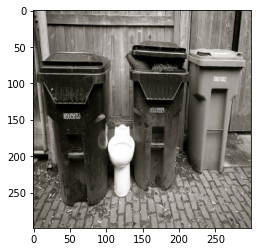

a white cat sitting on a table with a toilet .
a bathroom with a red and white and white
a small room with a white and white and white and white
------------------------------------------------------
Image 17:


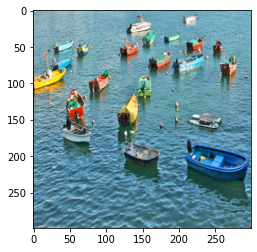

a man is sitting on a table with a plate .
a man is holding a large #UNK# on a field .
a man is standing in the grass in a field .
------------------------------------------------------
Image 18:


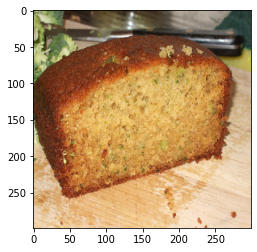

a large white cat sitting on a table .
a large white cat sitting on a table .
a large white cat sitting on a table .
------------------------------------------------------
Image 19:


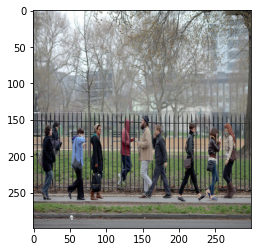

a man is standing on a field with a city .
a man is standing on a field with a plate .
a man is in the air in a table .
------------------------------------------------------
Image 20:


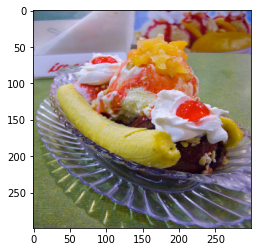

a large white cat sitting on a table with a large building .
a man with a man and a large #UNK# .
a small dog is sitting on a table .
------------------------------------------------------
Image 21:


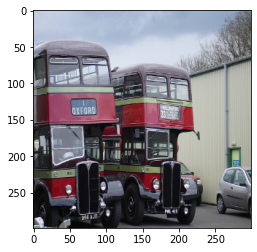

a man is on a skateboard with a street .
a red white bus is sitting on a table .
a large train is on a street .
------------------------------------------------------
Image 22:


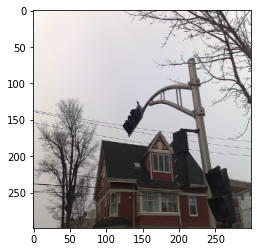

a man in a man with a white and white
a man in a bed with a building .
a white cat is sitting on a table .
------------------------------------------------------
Image 23:


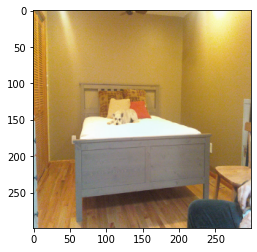

a white room with a large room with a red and white .
a man is sitting on a table with a large building .
a bathroom with a table with a cat and a large .
------------------------------------------------------
Image 24:


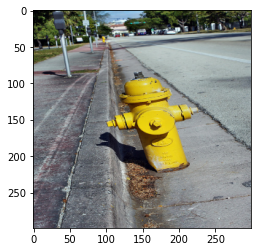

a train with a train on a street .
a man is sitting on a street with a table .
a man is on a table with a street .
------------------------------------------------------
Image 25:


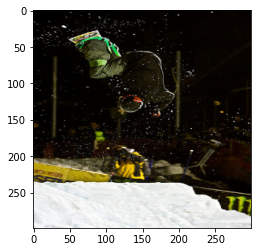

a man is on a table with a white and white
a man standing on a field with a plate .
a man is standing in a table with a white
------------------------------------------------------
Image 26:


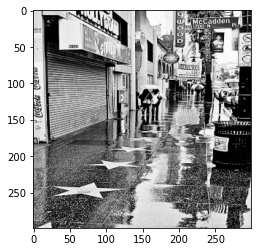

a woman is sitting on a table with a table .
a man is sitting on a skateboard with a city .
a man is on a street with a laptop .
------------------------------------------------------
Image 27:


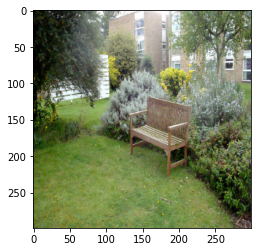

a man is in a motorcycle on a field .
a man is sitting on a table with a table .
a man is on a beach with a city .
------------------------------------------------------
Image 28:


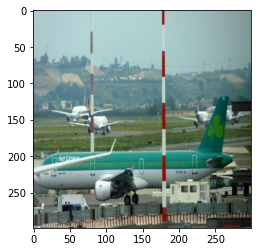

a man in a kitchen with a blue and white .
a man holding a red and white dog .
a man is sitting on a table with a white and white
------------------------------------------------------
Image 29:


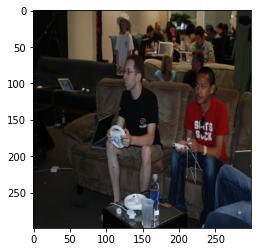

a man is sitting on a table with a plate .
a man is standing in a table with a banana .
a man is standing in a table with a large plate .
------------------------------------------------------


In [ ]:
for i in range(len(images_list)):
    print(f"Image {i}:")
    plt.imshow(images_list[i])
    plt.show()
    for _ in range(3):
      print(generate_caption(images_list[i], t=5.))
    print('------------------------------------------------------')

Comments:

The train loss is 3.88 and the val loss is 3.82.

The model gives us the different annotations where some parts are good and some part are not. 
* Good ones:
    - image 6: a man is a man in a field with a blue. 
    - image 29: a man is sitting on a table with a plate 

* Bad ones:
    - There are lots of bad ones. It is not identifying the objects as person or animal and vise versa. For instance, on image 2 there is a glass of bottle, but the model identified as a man.

    

## Second task

Continue training until 12 epoch. What happened to the loss value? Search for examples, that have improved their captions in comparison to 6 epoch training.

In [ ]:
DEVICE = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 12
n_batches_per_epoch = 200
n_validation_batches = 5

for epoch in tqdm(range(n_epochs)):
    
    train_loss = 0
    network.train()
    for _ in (range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    # clear_output()
    # if epoch % 10 == 0:
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")

  8%|▊         | 1/12 [00:08<01:28,  8.06s/it]


Epoch: 0, train loss: 4.783988953828811, val loss: 4.043442010879517


 17%|█▋        | 2/12 [00:16<01:22,  8.25s/it]


Epoch: 1, train loss: 3.8013096392154693, val loss: 3.653137683868408


 25%|██▌       | 3/12 [00:24<01:12,  8.11s/it]


Epoch: 2, train loss: 3.4189731431007386, val loss: 3.3087974071502684


 33%|███▎      | 4/12 [00:32<01:03,  7.94s/it]


Epoch: 3, train loss: 3.2105621838569642, val loss: 3.127329158782959


 42%|████▏     | 5/12 [00:39<00:55,  7.89s/it]


Epoch: 4, train loss: 3.0798778569698335, val loss: 2.9800787448883055


 50%|█████     | 6/12 [00:47<00:46,  7.74s/it]


Epoch: 5, train loss: 2.9910926365852357, val loss: 2.997606325149536


 58%|█████▊    | 7/12 [00:54<00:38,  7.63s/it]


Epoch: 6, train loss: 2.9256827878952025, val loss: 2.892770862579346


 67%|██████▋   | 8/12 [01:02<00:30,  7.59s/it]


Epoch: 7, train loss: 2.852149511575699, val loss: 2.8353456974029543


 75%|███████▌  | 9/12 [01:09<00:22,  7.63s/it]


Epoch: 8, train loss: 2.8125779211521147, val loss: 2.870464563369751


 83%|████████▎ | 10/12 [01:17<00:15,  7.51s/it]


Epoch: 9, train loss: 2.7786706948280333, val loss: 2.8199811935424806


 92%|█████████▏| 11/12 [01:24<00:07,  7.42s/it]


Epoch: 10, train loss: 2.7321614408493042, val loss: 2.7824141502380373


100%|██████████| 12/12 [01:32<00:00,  7.68s/it]


Epoch: 11, train loss: 2.7172537064552307, val loss: 2.7487679958343505
Finished!


Image 0:


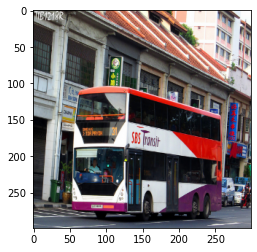

a bus is driving down a street in front of a building .
a bus is parked in front of a building .
a bus is parked in a parking lot .
------------------------------------------------------
Image 1:


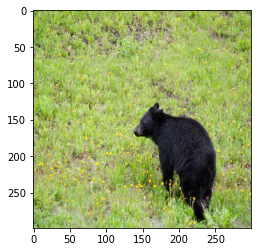

a black bear is standing in a field .
a black bear is standing in a field .
a black bear is standing in the grass .
------------------------------------------------------
Image 2:


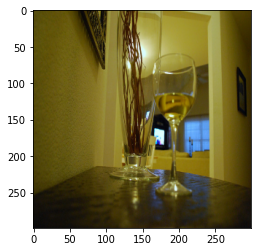

a glass vase with a glass of wine and a glass of wine .
a glass of wine and a glass of wine glasses .
a glass of wine glasses sitting on a table .
------------------------------------------------------
Image 3:


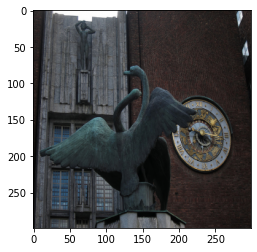

a cat sitting on a table with a glass of wine .
a cat sitting on a table in front of a window .
a cat sitting on a table with a window .
------------------------------------------------------
Image 4:


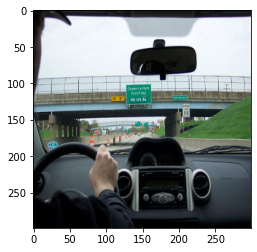

a man is sitting on a street with a red fire hydrant .
a man is sitting on a sidewalk with a dog .
a man is riding a skateboard down a street .
------------------------------------------------------
Image 5:


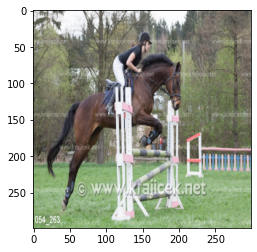

a man riding a horse on a horse .
a man riding a horse on a horse .
a man riding a horse on a horse .
------------------------------------------------------
Image 6:


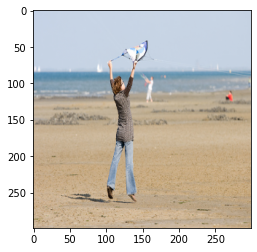

a man on a beach with a frisbee .
a man is holding a kite in the air .
a man on a beach holding a kite .
------------------------------------------------------
Image 7:


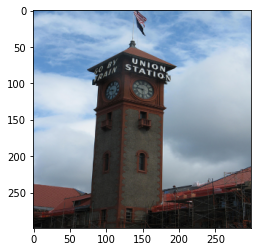

a clock tower with a clock on the side .
a clock tower with a clock on a wall .
a clock tower with a clock on the top .
------------------------------------------------------
Image 8:


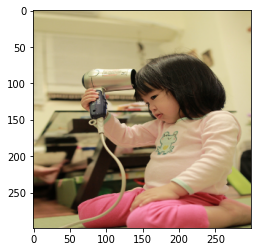

a woman holding a laptop and a laptop .
a woman sitting on a laptop with a laptop .
a man is sitting on a couch with a laptop computer .
------------------------------------------------------
Image 9:


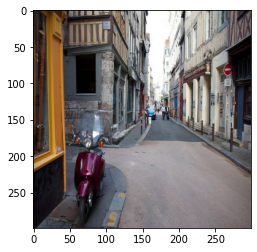

a bicycle is parked on a sidewalk next to a building .
a bicycle is parked next to a train .
a bicycle parked in a parking lot with a train .
------------------------------------------------------
Image 10:


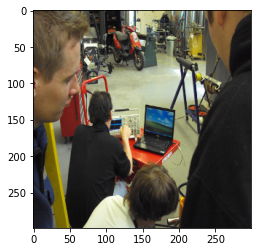

a man in a suit and a laptop on a laptop .
a man sitting on a laptop computer in a room .
a man sitting on a couch with a laptop computer .
------------------------------------------------------
Image 11:


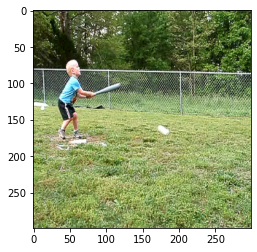

a group of people on a field playing soccer .
a man in a field playing soccer on a field .
a young man is playing tennis on a tennis court .
------------------------------------------------------
Image 12:


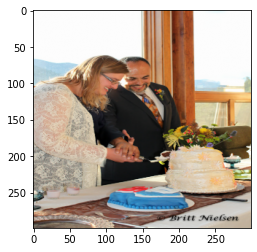

a man in a kitchen with a white plate .
a man and a woman in a kitchen with a cake .
a man and a woman sitting at a table .
------------------------------------------------------
Image 13:


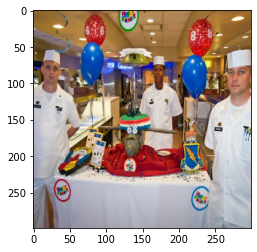

a group of people sitting on a table with a cake .
a group of people standing around a table with a cake .
a group of people standing around a table with a cake .
------------------------------------------------------
Image 14:


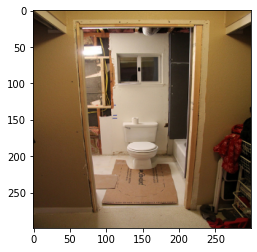

a bathroom with a toilet and a sink .
a bathroom with a toilet and a sink .
a bathroom with a toilet and a sink .
------------------------------------------------------
Image 15:


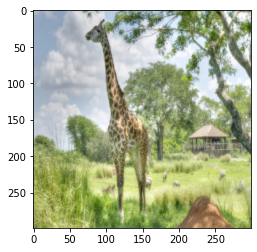

a giraffe standing in a field next to a tree .
a giraffe standing in a field with trees in the background .
a giraffe standing in a grassy area with trees .
------------------------------------------------------
Image 16:


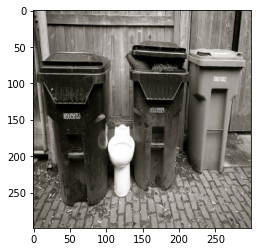

a white toilet sitting next to a window .
a white toilet sitting on a wooden table .
a white toilet sitting next to a window .
------------------------------------------------------
Image 17:


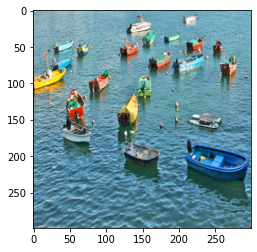

a group of people sitting on a boat in a boat .
a group of people sitting on a boat in a body of water .
a boat is sitting on a boat in the water .
------------------------------------------------------
Image 18:


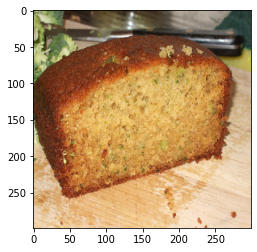

a large sandwich with a sandwich on it .
a sandwich with a sandwich and a cup of coffee .
a piece of cake on a plate on a table .
------------------------------------------------------
Image 19:


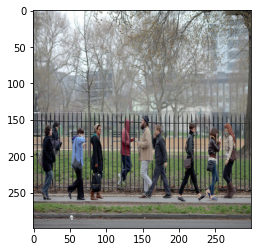

a group of people standing on a beach with a kite .
a group of people standing in front of a large crowd .
a group of people standing in the park with umbrellas .
------------------------------------------------------
Image 20:


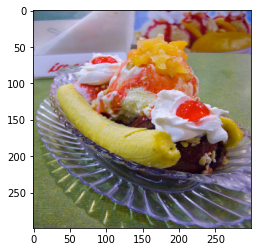

a plate with a sandwich and a sandwich on it .
a sandwich with a sandwich and a fork .
a plate with a sandwich and a sandwich on a plate .
------------------------------------------------------
Image 21:


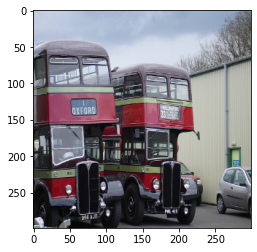

a double decker bus is parked in front of a building .
a double decker bus is parked on a street .
a double decker bus is parked on a street .
------------------------------------------------------
Image 22:


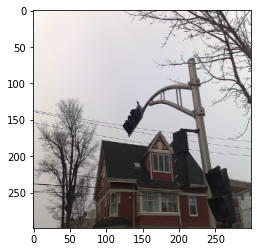

a red fire hydrant in a city street .
a red fire hydrant in a parking lot .
a sign that is on a pole .
------------------------------------------------------
Image 23:


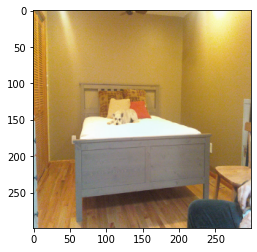

a small bathroom with a white toilet and a white toilet .
a bathroom with a toilet and a sink .
a small bathroom with a white toilet and a sink .
------------------------------------------------------
Image 24:


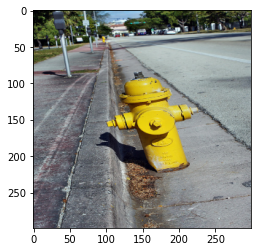

a fire hydrant sitting on a sidewalk next to a fire hydrant .
a fire hydrant on a sidewalk with a dog on it .
a fire hydrant on a sidewalk with a dog on it .
------------------------------------------------------
Image 25:


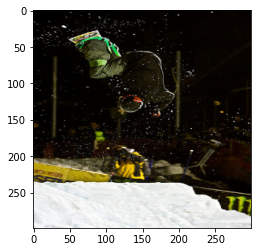

a person on a snowboard in the snow .
a man is riding a snowboard on a snowy surface .
a person on a snowboard on a snowy surface
------------------------------------------------------
Image 26:


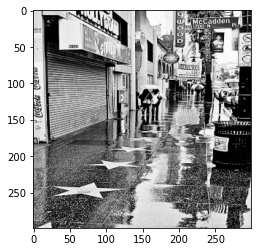

a man is standing next to a building .
a man in a red jacket is walking down the street .
a man standing on a sidewalk next to a building .
------------------------------------------------------
Image 27:


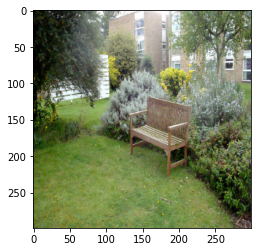

a bench sitting on a bench in front of a tree .
a bench sitting on a bench in front of a tree .
a bench sitting on a bench in front of a house .
------------------------------------------------------
Image 28:


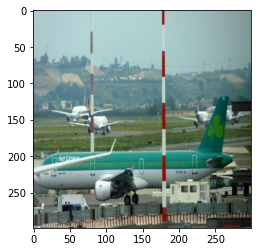

a large airplane is parked on the runway .
a large commercial airplane on a runway .
a large commercial airplane flying in the air .
------------------------------------------------------
Image 29:


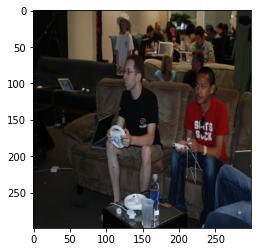

a group of people sitting on a couch with a laptop
a group of people sitting on a couch .
a group of people sitting on a table with a laptop .
------------------------------------------------------


In [ ]:
for i in range(len(images_list)):
    print(f"Image {i}:")
    plt.imshow(images_list[i])
    plt.show()
    for _ in range(3):
      print(generate_caption(images_list[i], t=5.))
    print('------------------------------------------------------')

Comments:

The train loss value is decreased to 2.71, val loss to 2.74.

Now we have more good annotaions:

Examples:

1.  image 0
* with 6 epochs: "a train is sitting on a table with a large building"
* with 12 epochs: "a bus is parked in front of a building"

2. image 12
* with 6 epochs: "a man is a man in a table with a white"
* with 12 epochs: "a man and a woman in a kitchen with a cake"

Some still not improved. For example:

1. image 8

* with 6 epochs: "a man standing on a table with a large"
* with 12 epochs: "a woman sitting on a laptop with a laptop"

2. image 23

* with 6 epochs: "a white room with a large room with a red and white"
* with 12 epochs: "a small bathroom with a white toilet and a white toilet"

To model improved, but still needs improvements. We need adjust some parameters

## Third task

Train the network until convergence. How many epoches do you need?

In [31]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)

DEVICE = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 120
n_batches_per_epoch = 650
n_validation_batches = 75

train_loss_list = []
val_loss_list = []
for epoch in tqdm(range(n_epochs)):
    
    train_loss = 0
    network.train()
    for _ in (range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    train_loss_list.append(train_loss)
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    val_loss_list.append(val_loss)
    # clear_output()
    if epoch % 10 == 0:
        print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")


  1%|          | 1/120 [00:24<48:04, 24.24s/it]


Epoch: 0, train loss: 3.921295132270226, val loss: 3.26967391649882


  9%|▉         | 11/120 [04:23<43:25, 23.90s/it]


Epoch: 10, train loss: 2.4275678730010988, val loss: 2.5056508572896323


 18%|█▊        | 21/120 [08:25<40:00, 24.25s/it]


Epoch: 20, train loss: 2.278742939875676, val loss: 2.4373425896962484


 26%|██▌       | 31/120 [12:26<35:36, 24.01s/it]


Epoch: 30, train loss: 2.214090706568498, val loss: 2.4157700030008953


 34%|███▍      | 41/120 [16:27<31:50, 24.18s/it]


Epoch: 40, train loss: 2.1525975762880765, val loss: 2.4115923404693604


 42%|████▎     | 51/120 [20:29<27:48, 24.18s/it]


Epoch: 50, train loss: 2.1226040702599747, val loss: 2.4145384661356606


 51%|█████     | 61/120 [24:28<23:22, 23.76s/it]


Epoch: 60, train loss: 2.0942765366114102, val loss: 2.4188819249471027


 59%|█████▉    | 71/120 [28:28<19:42, 24.14s/it]


Epoch: 70, train loss: 2.070384464263916, val loss: 2.4156939125061037


 68%|██████▊   | 81/120 [32:31<15:46, 24.26s/it]


Epoch: 80, train loss: 2.051368268453158, val loss: 2.4127823225657146


 76%|███████▌  | 91/120 [36:33<11:49, 24.46s/it]


Epoch: 90, train loss: 2.0304936418166526, val loss: 2.4559375286102294


 84%|████████▍ | 101/120 [40:35<07:40, 24.25s/it]


Epoch: 100, train loss: 2.0109078587018527, val loss: 2.4491760126749673


 92%|█████████▎| 111/120 [44:38<03:39, 24.36s/it]


Epoch: 110, train loss: 2.0033189074809736, val loss: 2.4609162553151447


100%|██████████| 120/120 [48:13<00:00, 24.12s/it]

Finished!


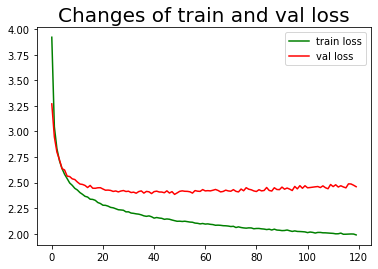

In [38]:
plt.plot(train_loss_list, color='green', label='train loss')
plt.plot(val_loss_list, color='red', label='val loss')
plt.title(label="Changes of train and val loss",
          fontsize=20,
          color="black")
plt.legend()
plt.show()

Comments:

The train loss converges to around 2 with 120 epochs, while the val loss is starting increasing 80-85 epochs. I will say that 85 epochs are needed.

## Fourth task

 Mobile devices are not very powerfull. Try reducing network size (emb_size=64, lstm_units=128), how it affected network quality after 12 epoches in comparison to original network? And visually?

In [42]:

DEVICE = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
network = CaptionNet(n_tokens=n_tokens, emb_size=64, lstm_units=128).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 12
n_batches_per_epoch = 650
n_validation_batches = 75

train_loss_list = []
val_loss_list = []
for epoch in tqdm(range(n_epochs)):
    
    train_loss = 0
    network.train()
    for _ in (range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        optimizer.zero_grad()
        loss_t.backward()
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    train_loss_list.append(train_loss)
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    val_loss_list.append(val_loss)
    # clear_output()
    if epoch % 4 == 0:
        print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")


  8%|▊         | 1/12 [00:16<02:59, 16.33s/it]


Epoch: 0, train loss: 4.378611251390898, val loss: 3.6743823305765786


 42%|████▏     | 5/12 [01:26<02:03, 17.70s/it]


Epoch: 4, train loss: 2.873033178402827, val loss: 2.886480747858683


 75%|███████▌  | 9/12 [02:38<00:53, 18.00s/it]


Epoch: 8, train loss: 2.667983058782724, val loss: 2.7160594113667806


100%|██████████| 12/12 [03:32<00:00, 17.71s/it]

Finished!


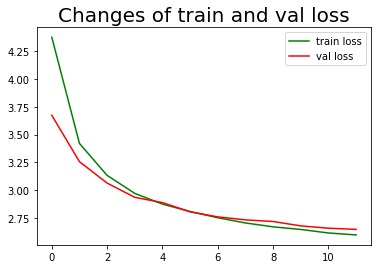

In [43]:
plt.plot(train_loss_list, color='green', label='train loss')
plt.plot(val_loss_list, color='red', label='val loss')
plt.title(label="Changes of train and val loss",
          fontsize=20,
          color="black")
plt.legend()
plt.show()

## Fifth task

Collect at least 10 images that you like to test our network on.
   - Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
   - Make sure it works okay on simple images before going to something more complex
   - Photos, not animation/3d/drawings, unless you want to train CNN network on anime
   - Mind the aspect ratio
   - Photos should not be from MSCOCO! Collect some data yourself, take anything you find worth testing on

In [45]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [48]:
to_caption_images_list = []

for i in range(1,14):
    img_path = f'/content/gdrive/MyDrive/content/project_photos/img{i}.jpeg'
    img = plt.imread(img_path)
    img = resize(img, (299, 299))
    to_caption_images_list.append(img)

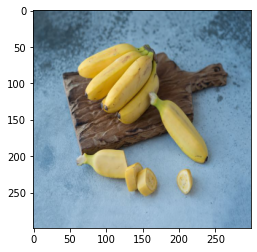

In [50]:
plt.imshow(to_caption_images_list[0])
plt.show()

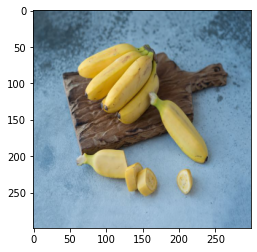

a banana and a banana on a table
a banana is shown with a banana and a banana .
a banana with a banana on top of it .
a banana is shown with a banana and a banana .
a banana and a banana on a plate with a banana .


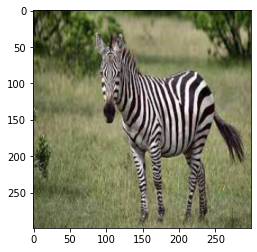

a zebra standing in a field with a lot of water .
a zebra standing in a field with a lot of trees .
a zebra standing in a field with a large tree .
a zebra standing on a lush green field .
a zebra standing in a field with a tree .


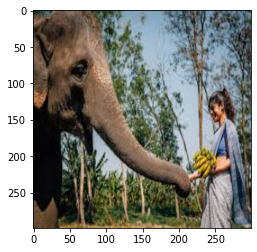

a man is riding a horse in a field .
a man is standing on a elephant in the water .
a man is standing on a elephant with a baby elephant .
a man is standing on a elephant in a field .
a man in a suit and a baby elephant .


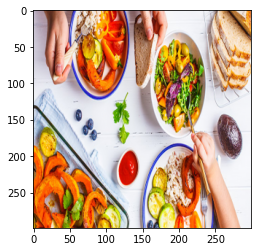

a plate of food with a variety of food on it .
a table with a plate of food and a plate of food .
a plate of food with a salad and a plate of food .
a plate of food with a plate of food .
a table with plates of food and a plate of food .


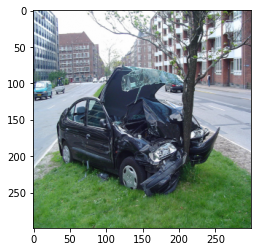

a car is parked on a bench with a dog .
a car is parked on a bench in the rain .
a car is parked on a bench in front of a building .
a motorcycle parked on a sidewalk next to a truck .
a car parked on a bench in a parking lot .


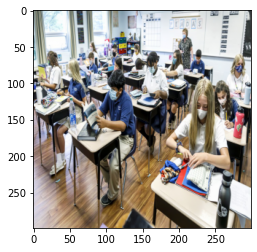

a group of people sitting at a table with laptops .
a group of people sitting around a table with a laptop .
a group of people sitting around a table with laptops
a group of people sitting at a table with laptops .
a group of people sitting around a table with laptops .


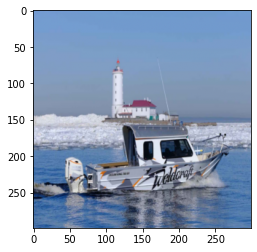

a boat is docked in the water with a boat in the background .
a boat is in the water with a boat in the background .
a boat is parked on a boat in the water .
a boat with a boat in the water .
a boat is sitting on a boat in the water .


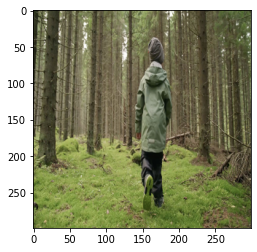

a man standing in a suit and tie standing on a street .
a man in a suit and tie in a room .
a man is standing in front of a man wearing a hat .
a man in a suit and tie standing in front of a building .
a man is standing in front of a man in a suit and tie .


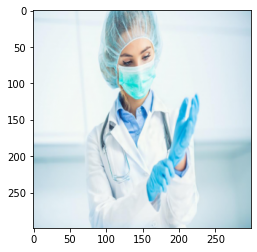

a man with a tie and a tie in the background .
a man with a tie and a tie on a sidewalk .
a woman holding a white tie with a tie .
a man holding a banana and a banana .
a man with a tie and a tie in the background .


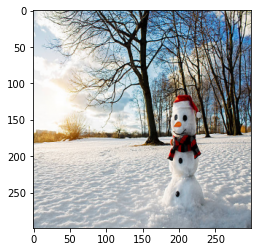

a dog is standing on a snow covered ground .
a dog is standing on a snow covered ground .
a dog is standing on a snow covered ground .
a dog is standing on a snow covered ground .
a dog is standing on a snow covered field .


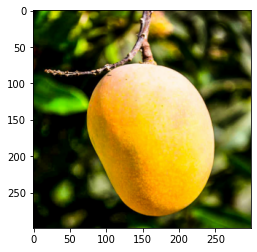

a blue and white bowl filled with oranges .
a yellow and white bowl filled with oranges .
a yellow and yellow bowl with a banana on it .
a yellow and yellow bowl filled with oranges .
a red and white bowl filled with oranges .


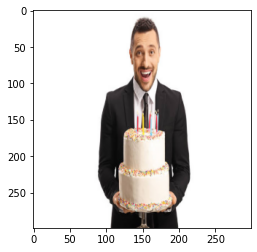

a man with a hat and a hat on a table
a man in a hat is standing next to a cake .
a man with a hat and a hat on a white plate .
a man with a hat and a hat on a table .
a man with a hat and a hat


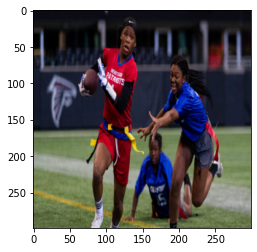

a man is playing frisbee on a tennis court .
a man holding a tennis racket on a tennis court .
a man holding a frisbee in a field
a man with a frisbee on a tennis court .
a man holding a frisbee in front of a tennis ball .


In [51]:
for i in range(len(to_caption_images_list)):
    plt.imshow(to_caption_images_list[i])
    plt.show()
    for _ in range(5):
      print(generate_caption(to_caption_images_list[i], t=5.))
    

Comments:

Most images have good annotations. Images with one object or group of objects like food, people were recognized good. Some complicated images were hard for the model. For instanse, image with a snowman where model catched the dog or image with a mango where it was identified as a bowl.